In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import zipfile
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from keras.models import save_model


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imagens/homer_bart_1/homer102.bmp
/kaggle/input/imagens/homer_bart_1/homer117.bmp
/kaggle/input/imagens/homer_bart_1/bart9.bmp
/kaggle/input/imagens/homer_bart_1/bart72.bmp
/kaggle/input/imagens/homer_bart_1/homer76.bmp
/kaggle/input/imagens/homer_bart_1/bart56.bmp
/kaggle/input/imagens/homer_bart_1/bart144.bmp
/kaggle/input/imagens/homer_bart_1/bart151.bmp
/kaggle/input/imagens/homer_bart_1/homer87.bmp
/kaggle/input/imagens/homer_bart_1/bart51.bmp
/kaggle/input/imagens/homer_bart_1/homer95.bmp
/kaggle/input/imagens/homer_bart_1/homer78.bmp
/kaggle/input/imagens/homer_bart_1/bart70.bmp
/kaggle/input/imagens/homer_bart_1/bart87.bmp
/kaggle/input/imagens/homer_bart_1/bart123.bmp
/kaggle/input/imagens/homer_bart_1/bart165.bmp
/kaggle/input/imagens/homer_bart_1/homer103.bmp
/kaggle/input/imagens/homer_bart_1/homer14.bmp
/kaggle/input/imagens/homer_bart_1/homer47.bmp
/kaggle/input/imagens/homer_bart_1/bart166.bmp
/kaggle/input/imagens/homer_bart_1/homer71.bmp
/kaggle/input/ima

# Extração de pixels de imagem

In [2]:
directory = '../input/imagens/homer_bart_1'
files = [os.path.join(directory, f) for f in sorted(os.listdir(directory))]


In [3]:
width, heigth = 128, 128
images = []
classes = []

In [4]:
for image_path in files:
    try: 
        image = cv2.imread(image_path)
        (H, W) = image.shape[:2]
    except:
        continue
    
    image = cv2.resize(image, (width, heigth))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    image = image.ravel()
    
    images.append(image)
    image_name = os.path.basename(os.path.normpath(image_path))
    if image_name.startswith('b'):
        classe = 0
    else:
        classe = 1
    
    classes.append(classe)

In [5]:
X = np.asarray(images)
y = np.asarray(classes)

# Normalização dos pixels

In [6]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)

# Base de Treinamento e Teste

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1)

# Construção e Treinamento da Rede Neural

In [8]:
network1 = tf.keras.models.Sequential()
network1.add(tf.keras.layers.Dense(input_shape = (16384,), units = 8193, activation = 'relu'))
network1.add(tf.keras.layers.Dense(units = 8193, activation = 'relu'))
network1.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

2022-08-18 18:39:24.696974: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [9]:
network1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8193)              134242305 
_________________________________________________________________
dense_1 (Dense)              (None, 8193)              67133442  
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 8194      
Total params: 201,383,941
Trainable params: 201,383,941
Non-trainable params: 0
_________________________________________________________________


In [10]:
network1.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

In [11]:
historic = network1.fit(X_train, y_train, epochs=50)

2022-08-18 18:39:26.648648: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/50
7/7 [==============================] - 6s 621ms/step - loss: 147.9791 - accuracy: 0.5395
Epoch 2/50
7/7 [==============================] - 4s 566ms/step - loss: 20.4374 - accuracy: 0.4744
Epoch 3/50
7/7 [==============================] - 4s 561ms/step - loss: 8.2384 - accuracy: 0.5256
Epoch 4/50
7/7 [==============================] - 4s 576ms/step - loss: 2.8190 - accuracy: 0.5628
Epoch 5/50
7/7 [==============================] - 4s 575ms/step - loss: 0.8090 - accuracy: 0.5395
Epoch 6/50
7/7 [==============================] - 4s 572ms/step - loss: 0.6784 - accuracy: 0.5488
Epoch 7/50
7/7 [==============================] - 4s 561ms/step - loss: 0.6601 - accuracy: 0.6140
Epoch 8/50
7/7 [==============================] - 4s 616ms/step - loss: 0.6567 - accuracy: 0.6140
Epoch 9/50
7/7 [==============================] - 4s 565ms/step - loss: 0.6451 - accuracy: 0.6140
Epoch 10/50
7/7 [==============================] - 4s 568ms/step - loss: 0.6648 - accuracy: 0.5907
Epoch 11/50
7/7 

# Avaliação da Rede Neural

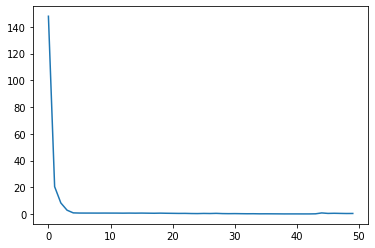

In [12]:
plt.plot(historic.history['loss'])

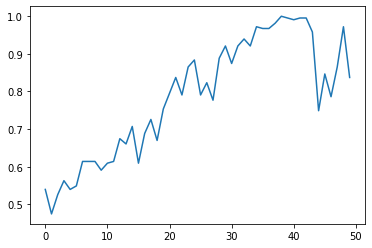

In [13]:
plt.plot(historic.history['accuracy'])

In [14]:
predicts = network1.predict(X_test)
predicts = (predicts > 0.5)

In [15]:
accuracy_score(y_test, predicts)

0.6111111111111112

<AxesSubplot:>

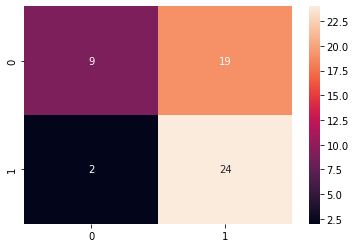

In [16]:
cm = confusion_matrix(y_test, predicts)
sns.heatmap(cm, annot=True)

In [17]:
print(classification_report(y_test, predicts))

              precision    recall  f1-score   support

           0       0.82      0.32      0.46        28
           1       0.56      0.92      0.70        26

    accuracy                           0.61        54
   macro avg       0.69      0.62      0.58        54
weighted avg       0.69      0.61      0.57        54



# Salvar e Carregar Rede Neural

In [18]:
model_json = network1.to_json()
with open('network1.json', 'w') as json_file:
    json_file.write(model_json)

In [19]:
network1_saved = save_model(network1, 'weights1.hdf5')

In [20]:
with open('network1.json', 'r') as json_file:
    json_saved_model = json_file.read()

In [21]:
network1_loaded = tf.keras.models.model_from_json(json_saved_model)
network1_loaded.load_weights('./weights1.hdf5')
network1_loaded.compile(loss = 'binary_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

In [22]:
network1_loaded.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8193)              134242305 
_________________________________________________________________
dense_1 (Dense)              (None, 8193)              67133442  
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 8194      
Total params: 201,383,941
Trainable params: 201,383,941
Non-trainable params: 0
_________________________________________________________________


# Classificação de uma Única Imagem

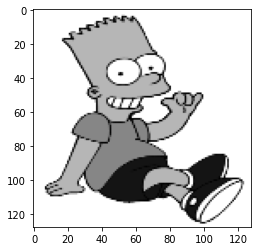

In [23]:
image_test = X_test[0]
image_test = scaler.inverse_transform(image_test.reshape(1, -1))
plt.imshow(image_test.reshape(128,128), cmap='gray')


In [24]:
network1_loaded.predict(image_test)[0][0]

0.0

In [25]:
if network1_loaded.predict(image_test)[0][0] < 0.5:
    print('Bart')
else:
    print('Homer')

Bart


# Extração de Caracteristicas da Imagem

In [26]:
files = [os.path.join(directory, f) for f in sorted(os.listdir(directory))]

In [27]:
export = 'boca,calca,sapato,camisa,calcao,tenis,classe\n'

In [28]:
show_img = True
features = []

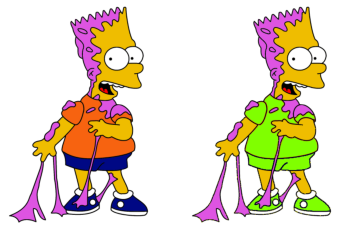

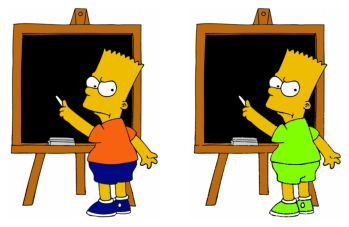

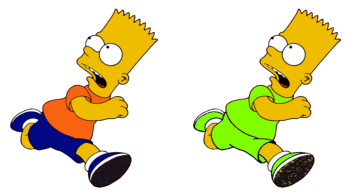

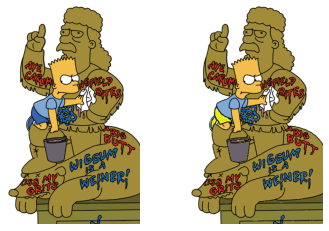

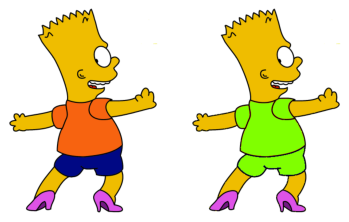

...

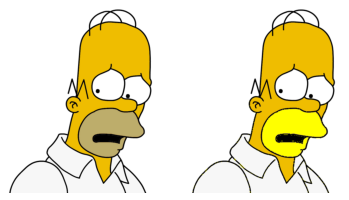

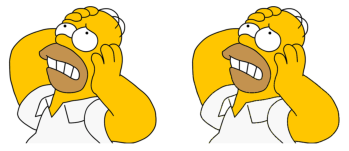

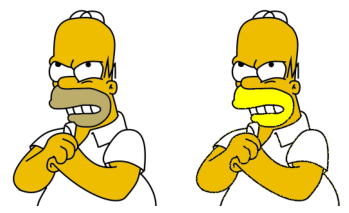

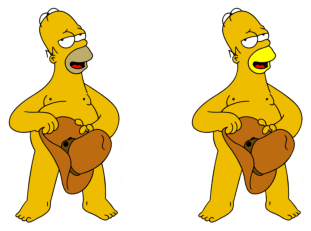

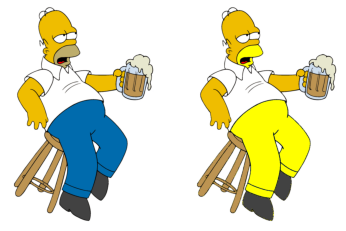

In [29]:
for image_path in files:
    try: 
        image_origin = cv2.imread(image_path)
        (H, W) = image_origin.shape[:2]
    except:
        continue
        
    image_changed = image_origin.copy()
    image_features = []
    image_name = os.path.basename(os.path.normpath(image_path))
    mouth = pants = shoes = 0
    shirt = shorts = tennis = 0
    
    
    if image_name.startswith('b'):
        classe = 0
    else:
        classe = 1
        
    for heigth in range(0, H):
        for width in range(0, W):
            blue = image_changed.item(heigth, width, 0)
            green = image_changed.item(heigth, width, 1)
            red = image_changed.item(heigth, width, 2)
            
            # homer mouth color Brown
            if (blue >= 95 and blue <= 140 and green >= 160 and green <= 185 and red >= 175 and red <= 205):
                image_changed[heigth, width] = [0, 255, 255]
                mouth += 1
                
            # homer pants color blue
            if (blue >= 150 and blue <= 180 and green >= 98 and green <= 120 and red >= 0 and red <= 90):
                image_changed[heigth, width] = [0, 255, 255]
                pants += 1
                
            # homer shoes color gray
            if heigth > (H / 2):                
                if (blue >= 20 and blue <= 45 and green >= 25 and green <= 45 and red >= 25 and red <= 45):
                    image_changed[heigth, width] = [0, 255, 255]
                    shoes += 1
                    
            # bart shirt color orange
            if (blue >= 11 and blue <= 50 and green >= 85 and green <= 105 and red >= 240 and red <= 255):
                image_changed[heigth, width] = [0, 255, 128]
                shirt += 1
                
            # bart shorts color blue
            if (blue >= 125 and blue <= 170 and green >= 0 and green <= 12 and red >= 0 and red <= 20):
                image_changed[heigth, width] = [0, 255, 128]
                shorts += 1
                
            # bart tennis color blue
            if heigth > (H / 2):                
                if (blue >= 125 and blue <= 170 and green >= 0 and green <= 12 and red >= 0 and red <= 20):
                    image_changed[heigth, width] = [0, 255, 128]
                    tennis += 1
                
    mouth = round((mouth / (H * W)) * 100, 9)
    pants = round((pants / (H * W)) * 100, 9)
    shoes = round((shoes / (H * W)) * 100, 9)
    shirt = round((shirt / (H * W)) * 100, 9) 
    shorts = round((shorts / (H * W)) * 100, 9) 
    tennis = round((tennis / (H * W)) * 100, 9) 
    
    image_features.append(mouth)
    image_features.append(pants)
    image_features.append(shoes)
    image_features.append(shirt) 
    image_features.append(shorts) 
    image_features.append(tennis) 
    image_features.append(classe)
    
    features.append(image_features)
    
    f = (','.join([str(item) for item in image_features]))
    export += f  + '\n'
    
    
    if show_img == True:
        image_changed = cv2.cvtColor(image_changed, cv2.COLOR_BGR2RGB)
        image_origin = cv2.cvtColor(image_origin, cv2.COLOR_BGR2RGB)
        figure, im, = plt.subplots(1, 2)
        im[0].imshow(image_origin)
        im[0].axis('off')
        im[1].imshow(image_changed)
        im[1].axis('off')
        plt.show()

In [30]:
with open('features.csv', 'w') as file:
    for line in export:
        file.write(line)
file.closed

True

In [31]:
dataset = pd.read_csv('features.csv')
dataset

,boca,calca,sapato,camisa,calcao,tenis,classe
0,0.000000,0.000000,0.222192,6.886102,3.495204,3.495204,0
1,0.000000,0.000000,0.140481,5.004901,3.183889,3.183889,0
2,0.000000,0.000000,0.182519,5.264620,5.029683,5.029683,0
3,0.000000,0.480168,0.080028,0.000000,0.000000,0.000000,0
4,0.000000,0.000000,0.047822,8.978929,3.459119,3.459119,0
...,...,...,...,...,...,...,...
264,6.485412,0.000000,0.202479,0.000000,0.000000,0.000000,1
265,0.000000,0.000000,0.174620,0.000000,0.000000,0.000000,1
266,4.264975,0.000000,0.368994,0.000000,0.000000,0.000000,1
267,1.429133,0.000000,0.035622,0.000000,0.000000,0.000000,1


# Base de treinamento e teste

In [32]:
X = dataset.iloc[:, 0:6].values
y = dataset.iloc[:, 6].values

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1) 

In [34]:
X_train.shape, y_train.shape

((215, 6), (215,))

In [35]:
X_test.shape, y_test.shape

((54, 6), (54,))

# Construção e treinamento da rede neural

In [36]:
network2 = tf.keras.Sequential()
network2.add(tf.keras.layers.Dense(input_shape = (6,), units = 4, activation='relu'))
network2.add(tf.keras.layers.Dense(units=4, activation='relu'))
network2.add(tf.keras.layers.Dense(units=4, activation='relu'))
network2.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [37]:
network2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 4)                 28        
_________________________________________________________________
dense_4 (Dense)              (None, 4)                 20        
_________________________________________________________________
dense_5 (Dense)              (None, 4)                 20        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 5         
Total params: 73
Trainable params: 73
Non-trainable params: 0
_________________________________________________________________


In [38]:
network2.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

In [39]:
historic = network2.fit(X_train, y_train, epochs = 200)

Epoch 1/200
7/7 [==============================] - 1s 2ms/step - loss: 0.6470 - accuracy: 0.6093
Epoch 2/200
7/7 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.6140
Epoch 3/200
7/7 [==============================] - 0s 2ms/step - loss: 0.6275 - accuracy: 0.6140
Epoch 4/200
7/7 [==============================] - 0s 2ms/step - loss: 0.6183 - accuracy: 0.6140
Epoch 5/200
7/7 [==============================] - 0s 2ms/step - loss: 0.6084 - accuracy: 0.6140
Epoch 6/200
7/7 [==============================] - 0s 2ms/step - loss: 0.5993 - accuracy: 0.6140
Epoch 7/200
7/7 [==============================] - 0s 2ms/step - loss: 0.5887 - accuracy: 0.6140
Epoch 8/200
7/7 [==============================] - 0s 2ms/step - loss: 0.5776 - accuracy: 0.6140
Epoch 9/200
7/7 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.6140
Epoch 10/200
7/7 [==============================] - 0s 2ms/step - loss: 0.5586 - accuracy: 0.6140
Epoch 11/200
7/7 [===========

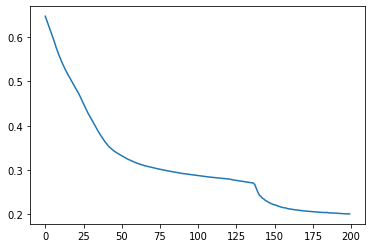

In [40]:
plt.plot(historic.history['loss'])

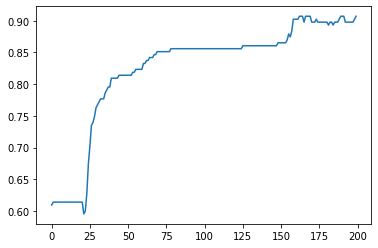

In [41]:
plt.plot(historic.history['accuracy'])

In [42]:
predict = network2(X_test)
predict = predict > 0.5


In [43]:
accuracy_score(y_test, predict)

0.9259259259259259

<AxesSubplot:>

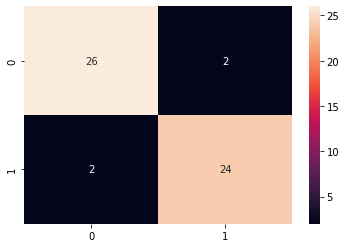

In [44]:
cm = confusion_matrix(y_test, predict)
sns.heatmap(cm, annot=True)

In [45]:
print(classification_report(y_test, predict))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        28
           1       0.92      0.92      0.92        26

    accuracy                           0.93        54
   macro avg       0.93      0.93      0.93        54
weighted avg       0.93      0.93      0.93        54

